
# __Digital Elevation Model Analysis using RichDEM__
---
This notebook provides an example of how to use the RichDEM library to calculate flow accumulation for a given digital elevation model.

## Installation and Required Imports
---

In [1]:
pip install richdem

  Using cached richdem-0.3.4-cp36-cp36m-manylinux1_x86_64.whl (4.5 MB)
You should consider upgrading via the '/env/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import richdem as rd

In [3]:
import rasterio
from rasterio.windows import Window

In [4]:
import numpy as np

## Using a GeoTIF
---

In [5]:
dem = rd.LoadGDAL("./n10w020_dem.tif")

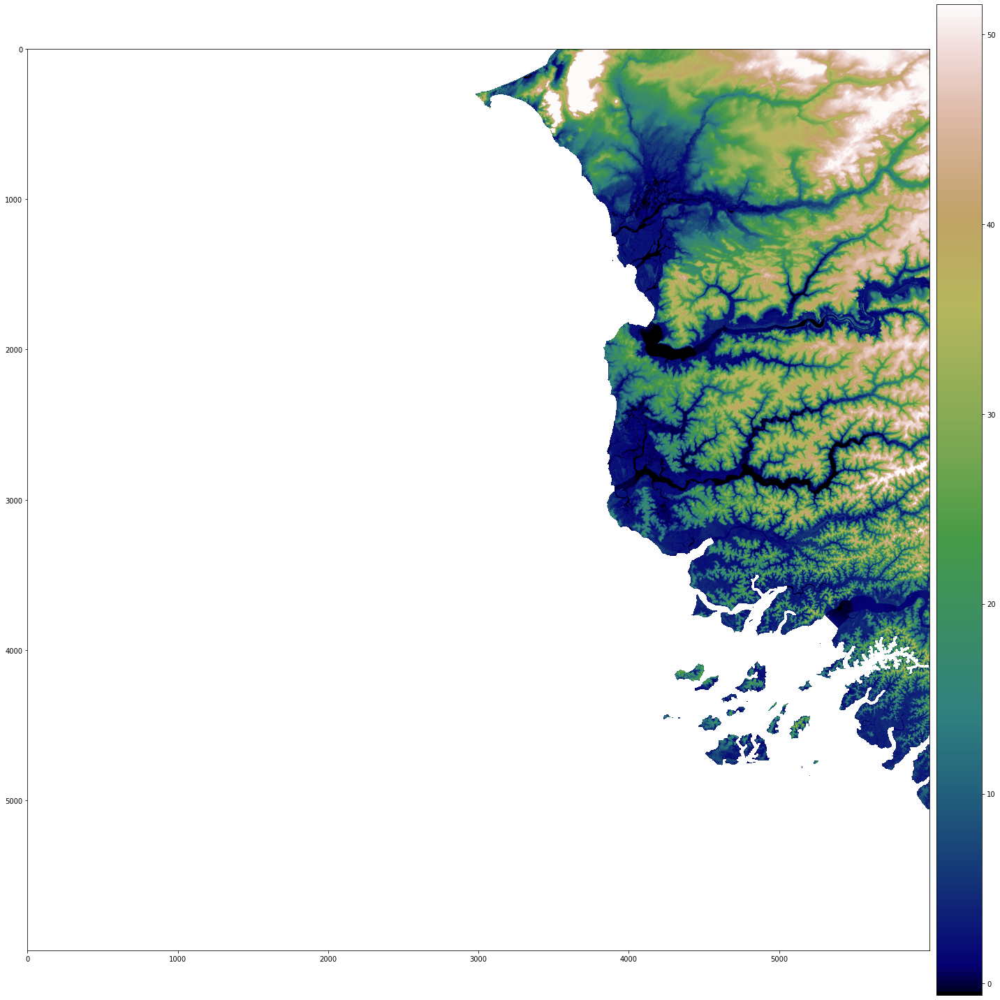

{'vmin': -0.6001630890369415, 'vmax': 51.56449264526367}

In [6]:
rd.rdShow(dem, axes=True, cmap='gist_earth', figsize=(20,20))

### Selecting an area of a GeoTIFF

In [7]:
with rasterio.open("./n10w020_dem.tif") as src:
                dakar_slice= src.read(1, window=Window(2800, 0, 800, 600))

In [8]:
dakar_dem = rd.rdarray(dakar_slice, no_data= -9999)
dakar_dem

rdarray([[-9999.      , -9999.      , -9999.      , ...,    23.254402,
             22.593271,    23.151716],
         [-9999.      , -9999.      , -9999.      , ...,    22.335863,
             22.343122,    23.32777 ],
         [-9999.      , -9999.      , -9999.      , ...,    21.624578,
             21.652967,    23.484879],
         ...,
         [-9999.      , -9999.      , -9999.      , ...,    19.07665 ,
             21.29177 ,    20.542862],
         [-9999.      , -9999.      , -9999.      , ...,    21.421732,
             22.04604 ,    21.413664],
         [-9999.      , -9999.      , -9999.      , ...,    21.692915,
             20.94717 ,    22.2173  ]], dtype=float32)

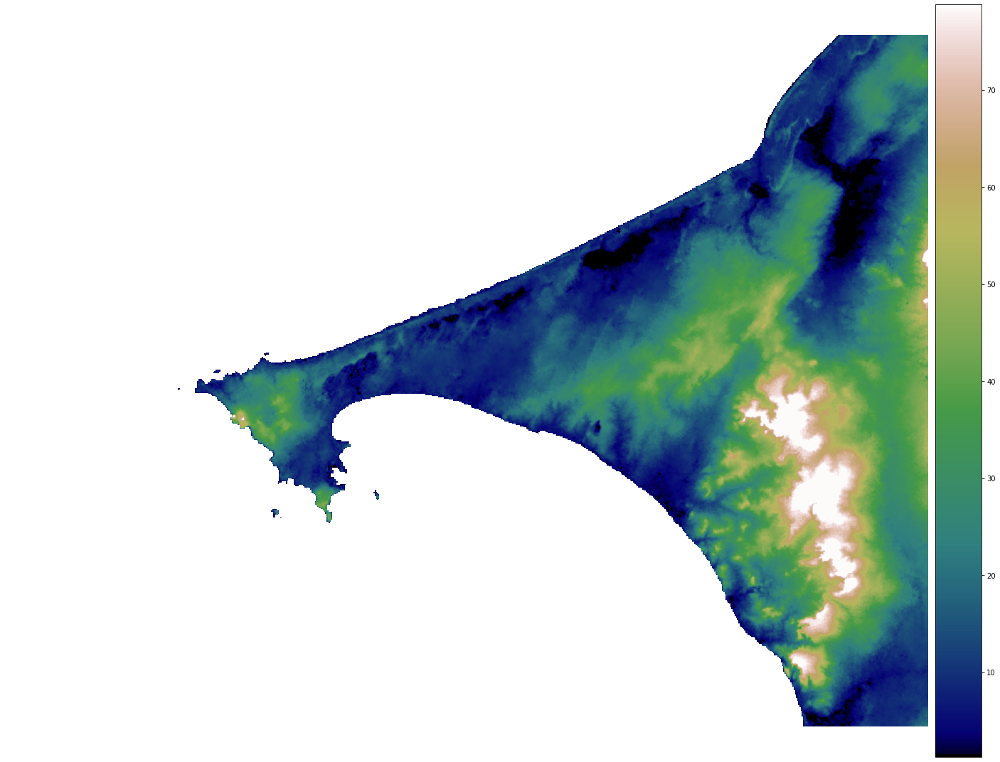

{'vmin': 1.2704766750335694, 'vmax': 78.81104583740232}

In [9]:
rd.rdShow(dakar_dem, axes=False, cmap='gist_earth', figsize=(20,15))

## Fill Depressions in the DEM
---

In [10]:
filled_dem = rd.FillDepressions(dem, epsilon=True)

In [11]:
dem_diff = filled_dem - dem

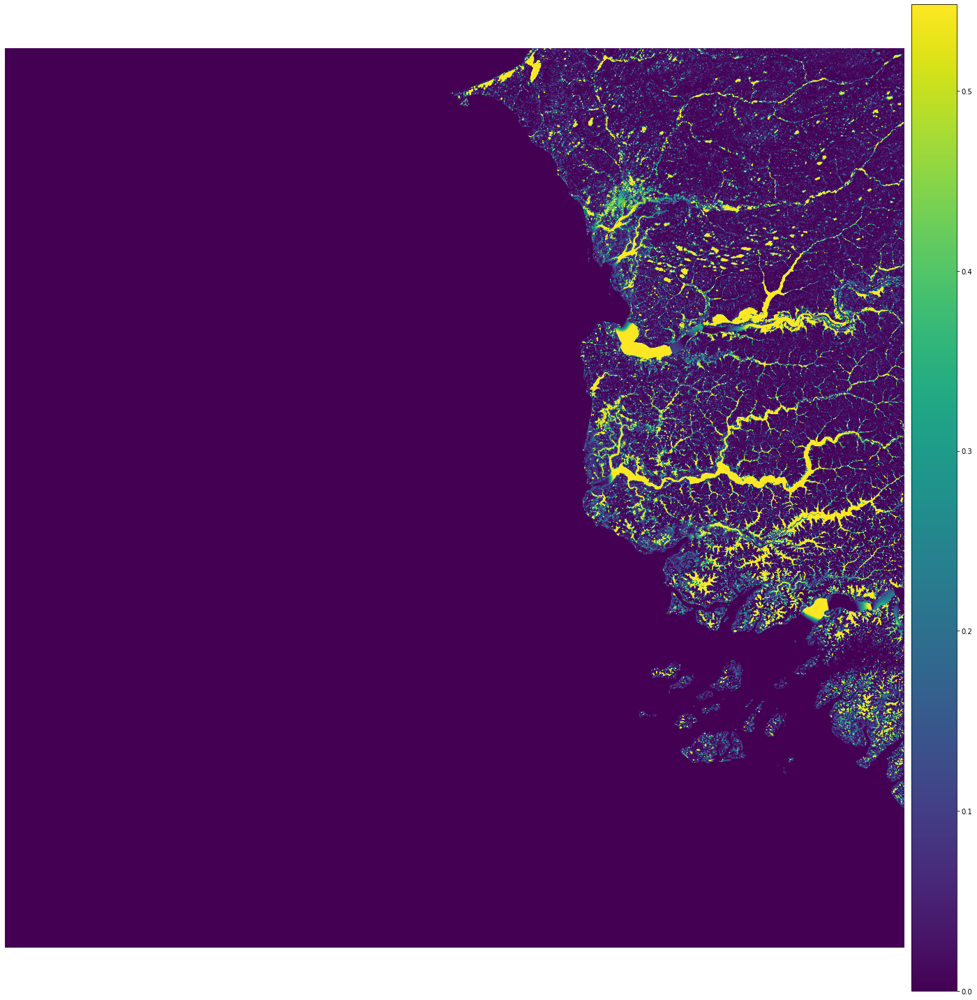

{'vmin': 0.0, 'vmax': 0.5480537509918193}

In [12]:
rd.rdShow(dem_diff, axes=False, cmap='viridis', figsize=(20,20))

## Calculate the Flow Accumulation
---

In [13]:
accum_flow = rd.FlowAccumulation(filled_dem, method='Dinf')

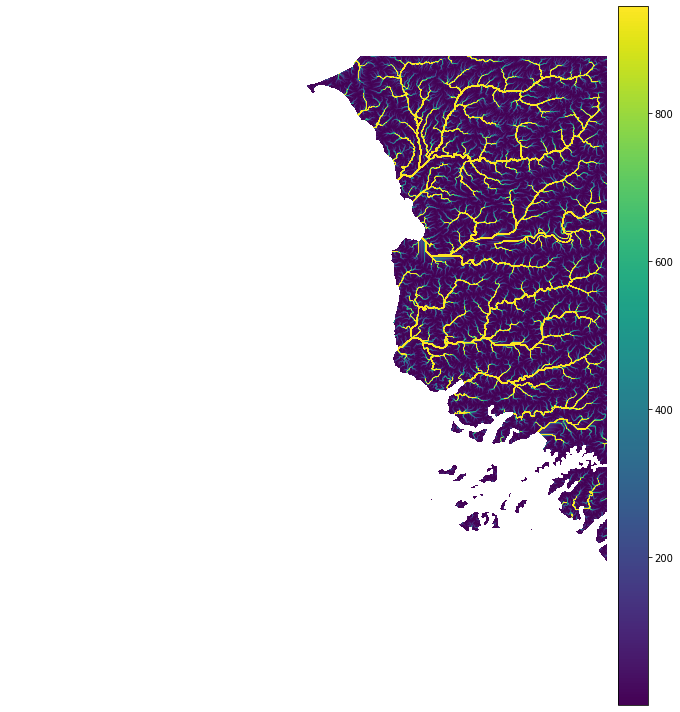

{'vmin': 1.0, 'vmax': 943.8819541826426}

In [14]:
rd.rdShow(accum_flow, axes=False, cmap='viridis', figsize=(10,10))

In [15]:
flow_no_fill = rd.FlowAccumulation(dem, method='Dinf')

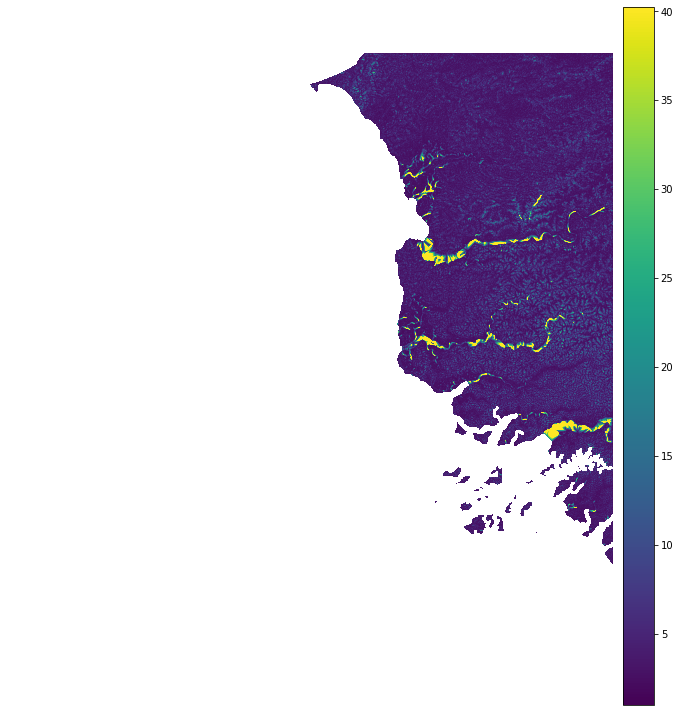

{'vmin': 1.0, 'vmax': 40.24467680437574}

In [16]:
rd.rdShow(flow_no_fill, axes=False, cmap='viridis', figsize=(10,10))

In [17]:
dakar_no_fill = rd.FlowAccumulation(dakar_dem, method='Dinf')

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


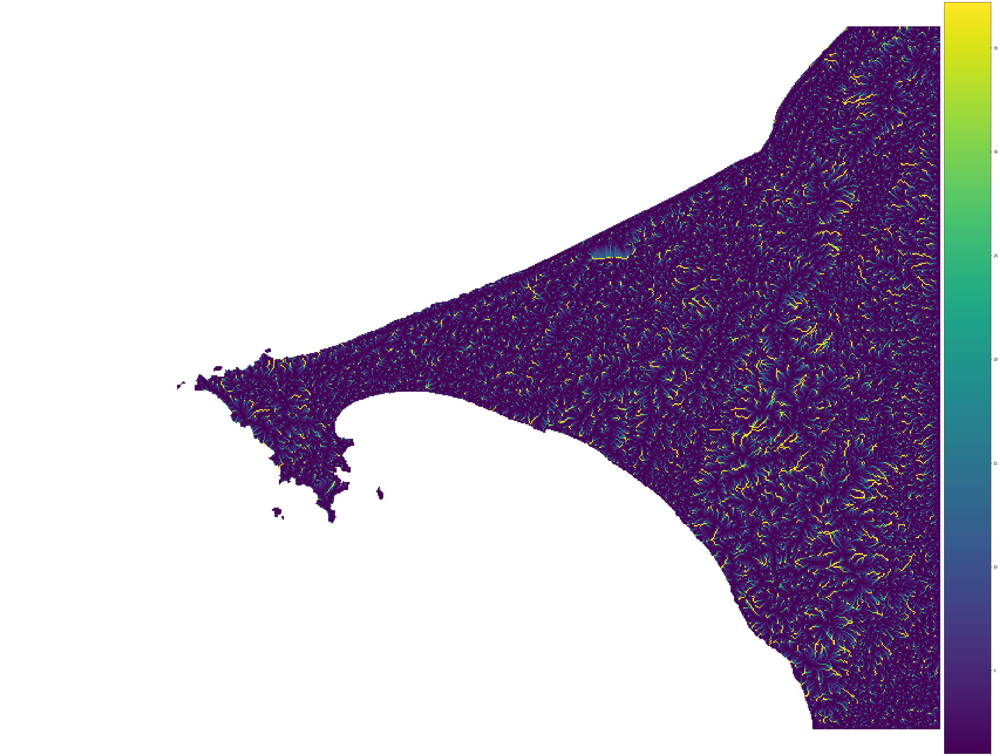

{'vmin': 1.0, 'vmax': 37.197708748717744}

In [18]:
rd.rdShow(dakar_no_fill, axes=False, cmap='viridis', figsize=(40,30))

In [19]:
dakar_fill = rd.FillDepressions(dakar_dem, epsilon=True)

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


In [20]:
dakar_diff = dakar_fill - dakar_dem

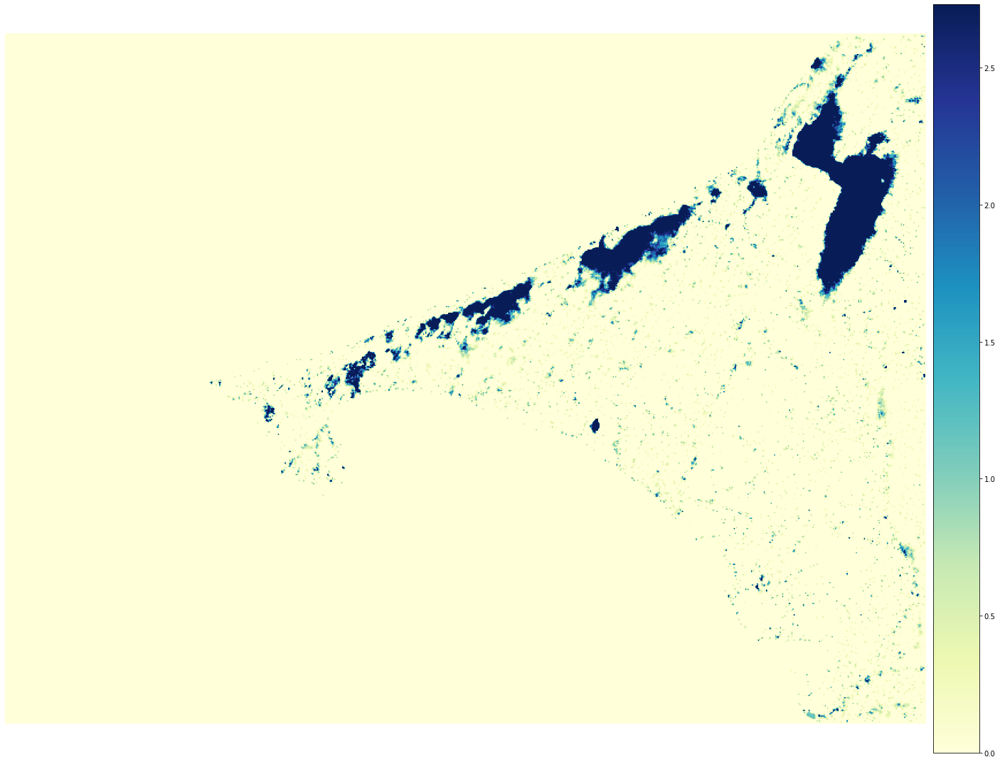

{'vmin': 0.0, 'vmax': 2.7311219787597683}

In [21]:
rd.rdShow(dakar_diff, axes=False, cmap='YlGnBu', figsize=(20,15))

In [22]:
dakar_flow_fill = rd.FlowAccumulation(dakar_fill, method='Dinf')

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


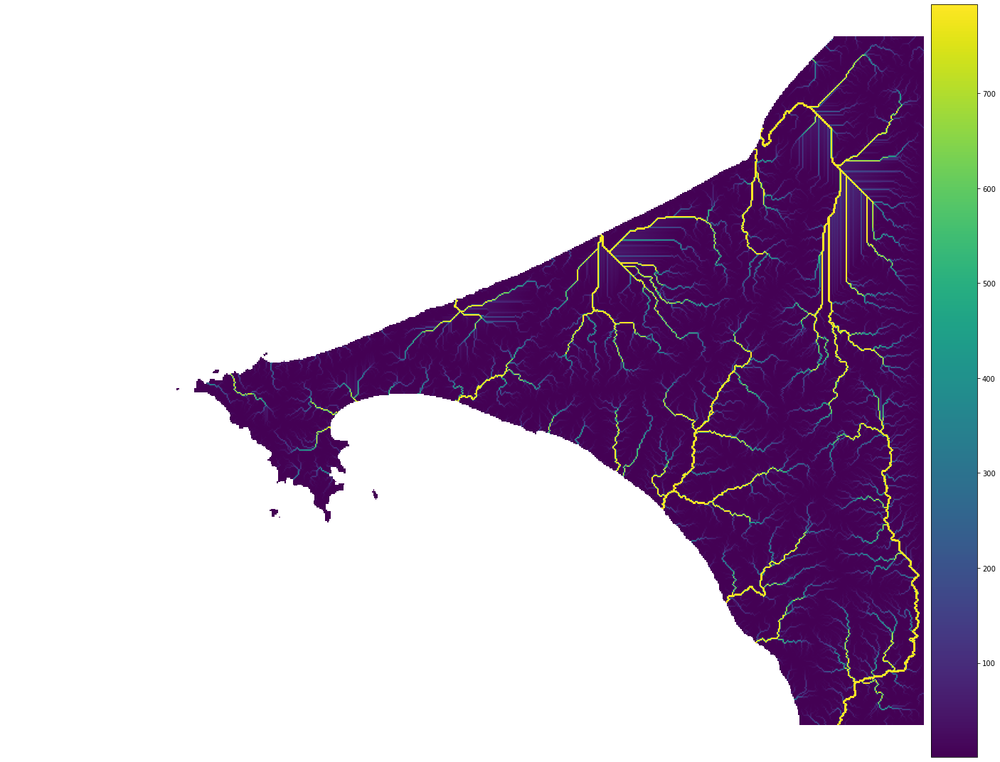

{'vmin': 1.0, 'vmax': 793.4680392950308}

In [23]:
rd.rdShow(dakar_flow_fill, axes=False, cmap='viridis', figsize=(20,15))

## T

In [24]:
dakar_aspect = rd.TerrainAttribute(dakar_dem, attrib='aspect')

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


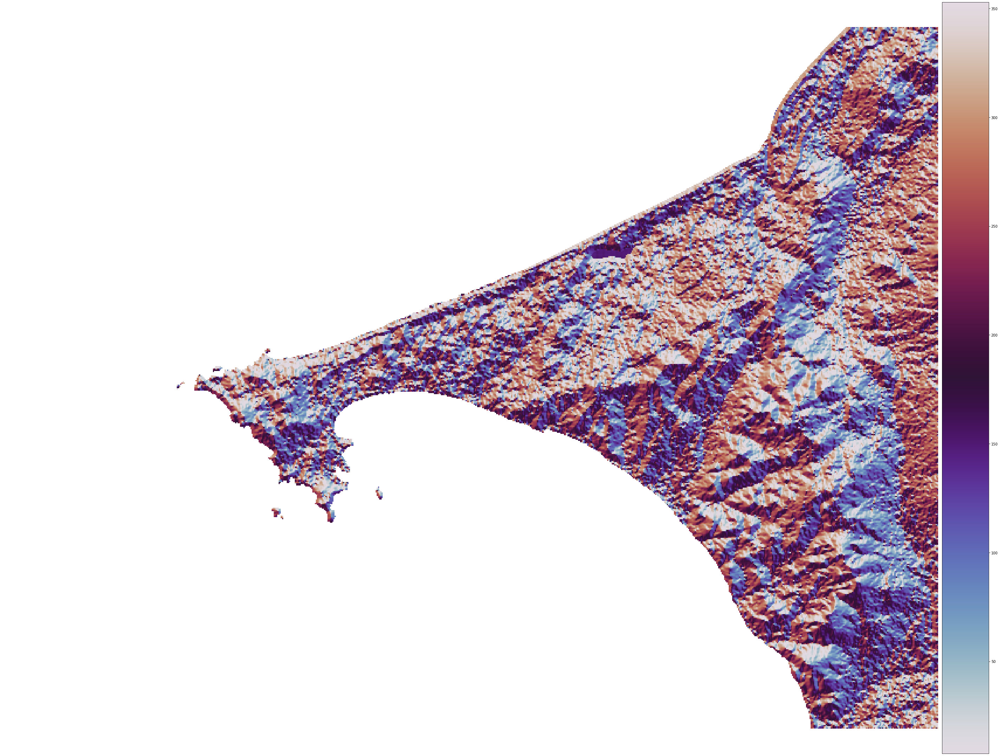

{'vmin': 7.669344711303712, 'vmax': 352.8804626464844}

In [25]:
rd.rdShow(dakar_aspect, axes=False, cmap='twilight', figsize=(40,30))

In [26]:
dakar_slope = rd.TerrainAttribute(dakar_dem, attrib='slope_riserun')

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


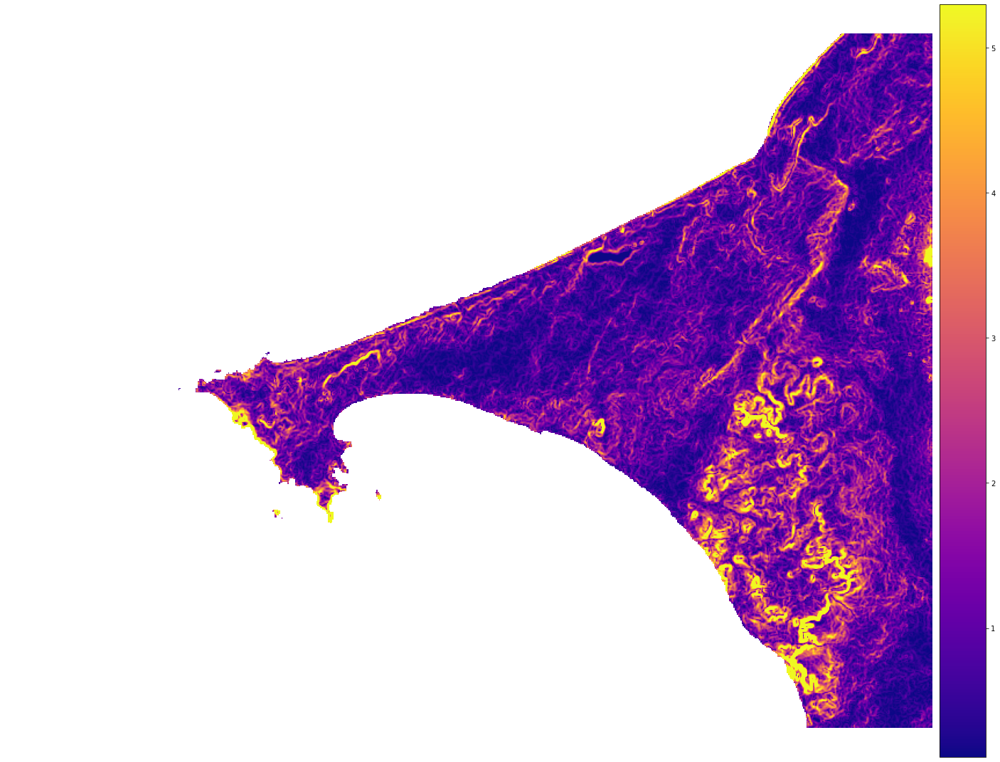

{'vmin': 0.11232959777116774, 'vmax': 5.297148227691641}

In [27]:
rd.rdShow(dakar_slope, axes=False, cmap='plasma', figsize=(20,15))

In [28]:
dakar_fill_aspect = rd.TerrainAttribute(dakar_fill, attrib='aspect')

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


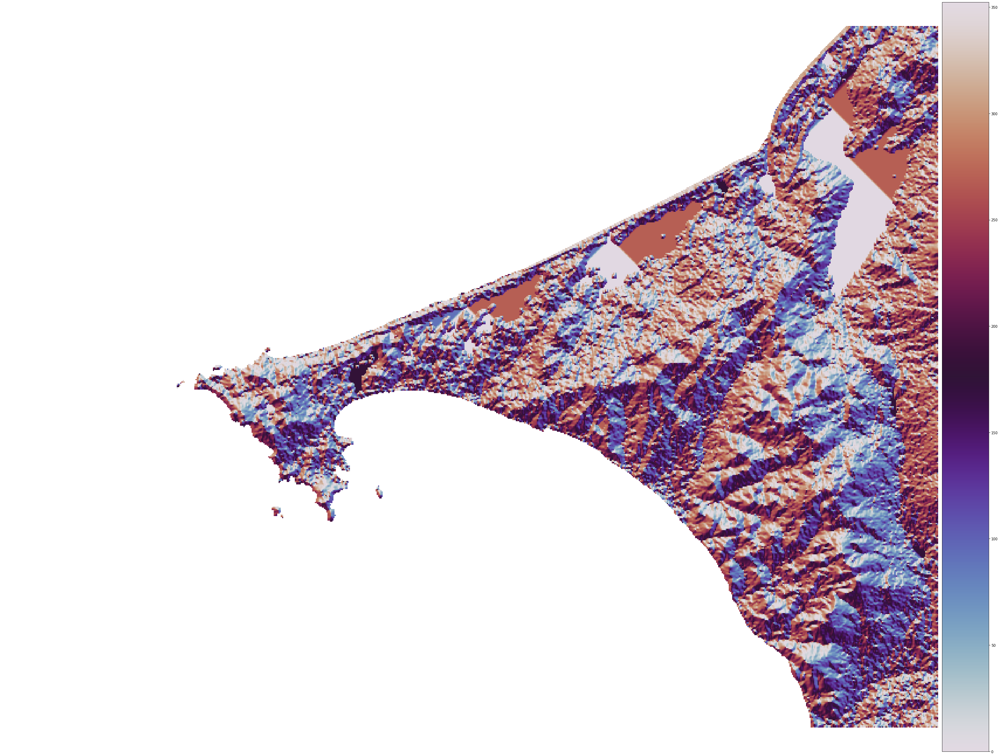

{'vmin': 0.0, 'vmax': 352.2765808105469}

In [29]:
rd.rdShow(dakar_fill_aspect, axes=False, cmap='twilight', figsize=(40,30))

In [30]:
dakar_fill_slope = rd.TerrainAttribute(dakar_fill, attrib='slope_riserun')

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


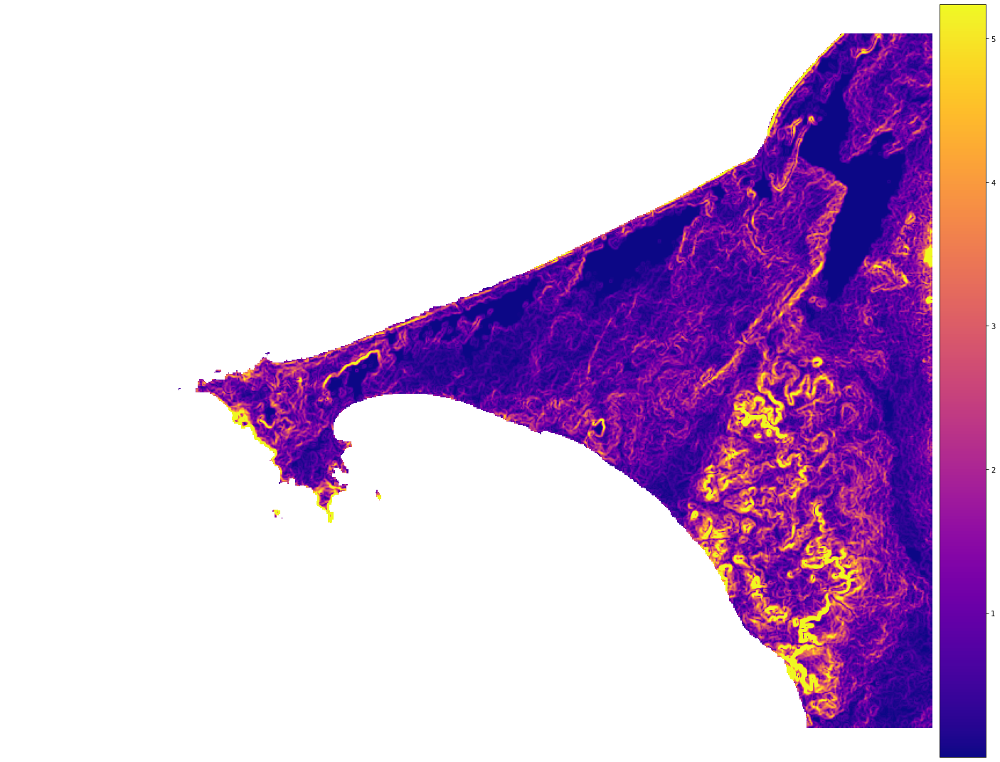

{'vmin': 4.76837158203125e-07, 'vmax': 5.234424877166745}

In [31]:
rd.rdShow(dakar_fill_slope, axes=False, cmap='plasma', figsize=(20,15))

In [32]:
from PIL import Image

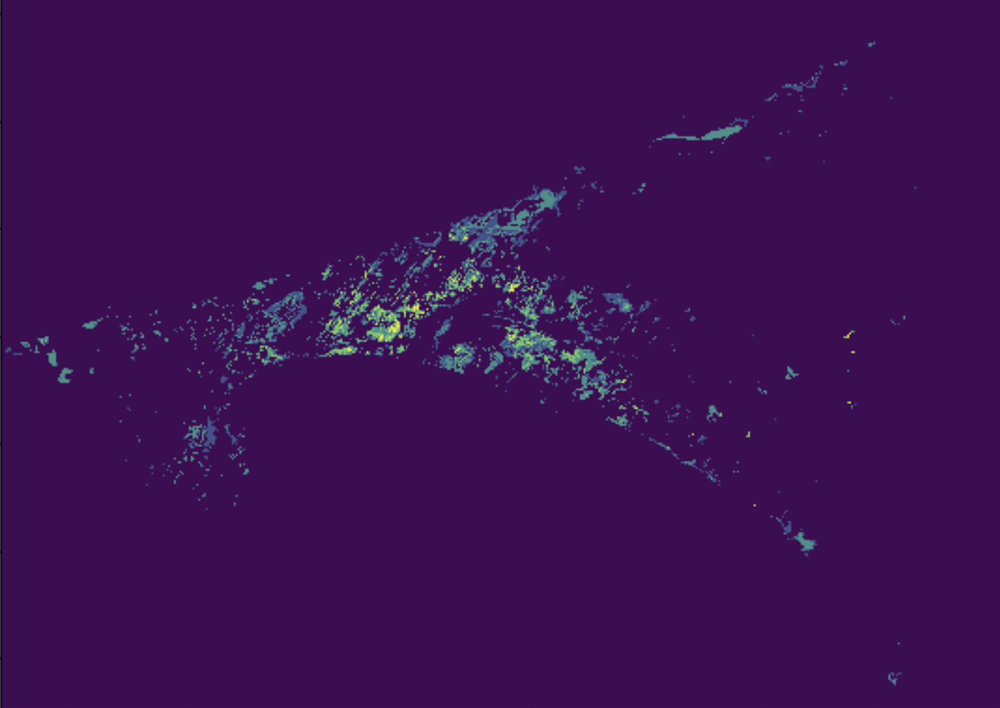

In [33]:
display(Image.open("./given_flood_risk.png"))

In [34]:
dakar_breach = rd.BreachDepressions(dakar_dem)

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


In [35]:
dakar_breach_diff = dakar_breach - dakar_dem

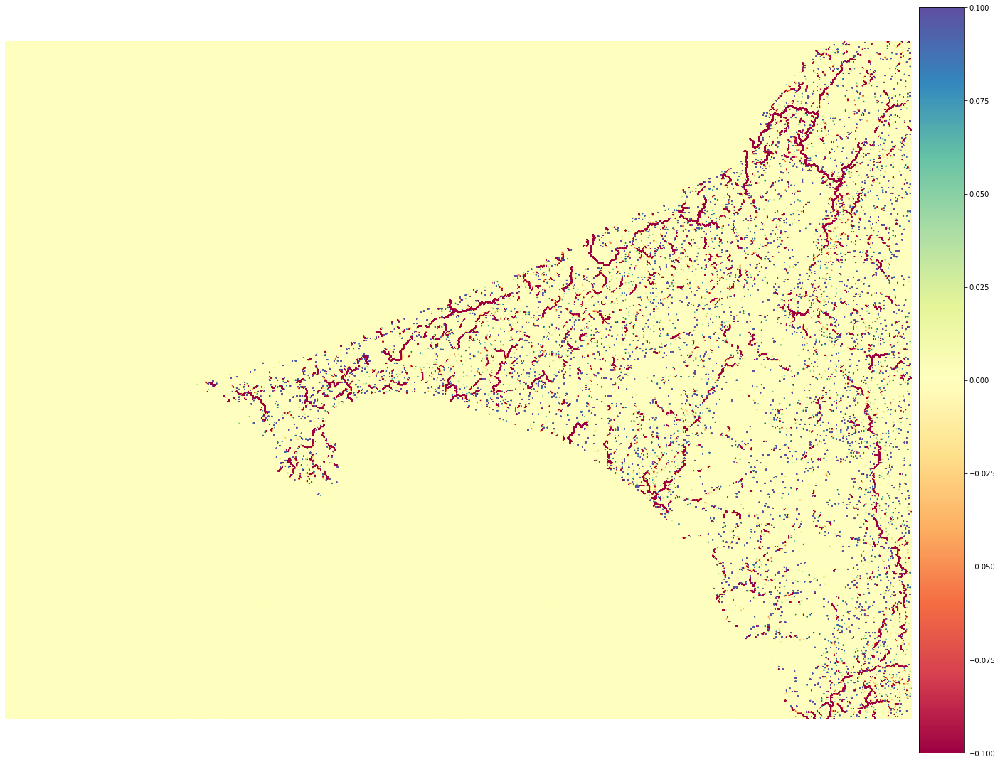

{'vmin': 0.0, 'vmax': 0.0}

In [36]:
rd.rdShow(dakar_breach_diff, axes=False, cmap='Spectral', figsize=(20,15))

In [37]:
dakar_flow_breach = rd.FlowAccumulation(dakar_breach, method='Holmgren', exponent=5)

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


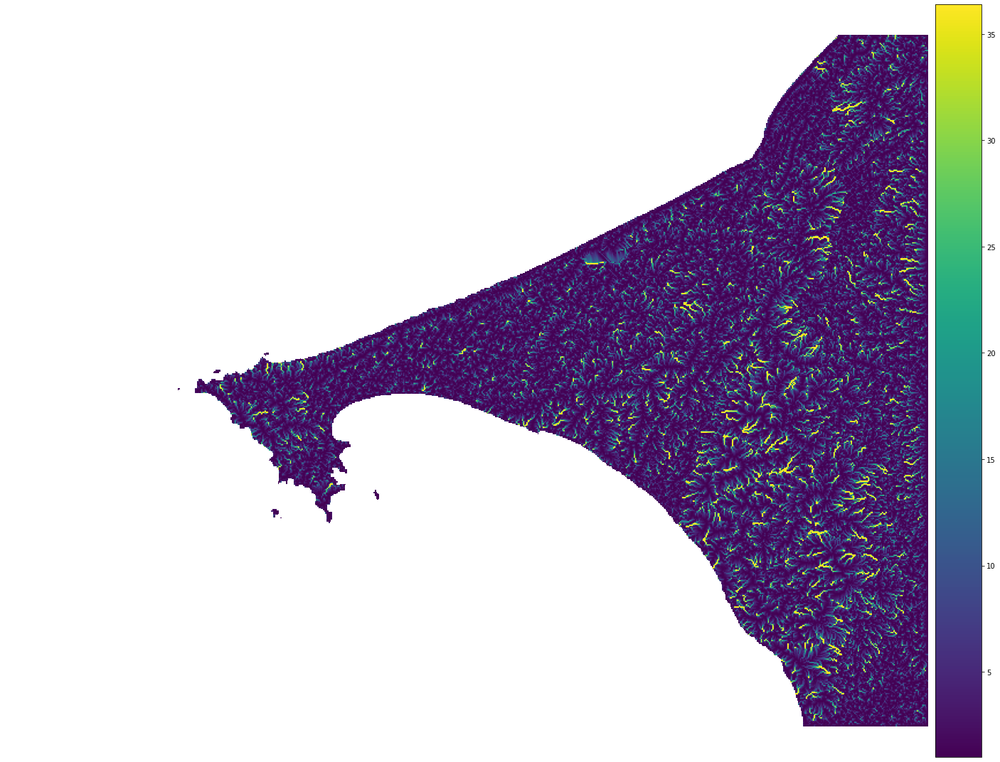

{'vmin': 1.0, 'vmax': 36.38423623430064}

In [38]:
rd.rdShow(dakar_flow_breach, axes=False, cmap='viridis', figsize=(20,15))

In [39]:
dakar_complete = rd.FillDepressions(dakar_dem, epsilon=False)

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


In [41]:
dakar_breach_flat = rd.BreachDepressions(dakar_complete)

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


In [43]:
dakar_resolved = rd.ResolveFlats(dakar_complete)

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


In [44]:
dakar_noeps = rd.FlowAccumulation(dakar_complete, method="Dinf")

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


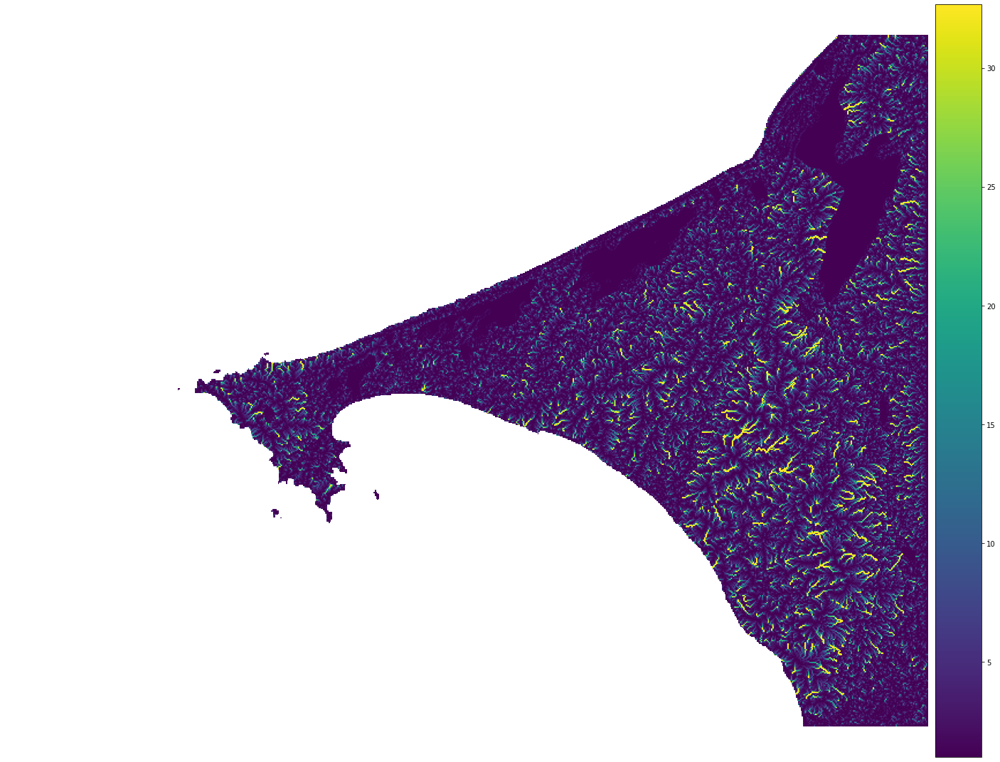

{'vmin': 1.0, 'vmax': 32.66874237556141}

In [45]:
rd.rdShow(dakar_noeps, axes=False, cmap='viridis', figsize=(20,15))

In [4]:
# dakar_props= rd.FlowProportions()

In [47]:
import datacube
cube = datacube.Datacube(app="dakar_flood_pngs")
products = cube.list_products()
display_columns = ["name",     "description",
                   "platform",
                   "instrument",
                   "crs",
                   "resolution"]
lat = (14.57695, 14.90730)
lon = (-17.53014, -17.09629)
time = ('2018-01-01', '2020-12-31')

query = {
        'x': lon,
        'y': lat,
        'time': time,
        'measurements': [ 'red','green','blue'],
        'output_crs': 'EPSG:4326',
        'resolution': (-0.00027,0.00027)
    }           
products[display_columns].sort_index()

,name,description,platform,instrument,crs,resolution
id,,,,,,
1,ls8_usgs_sr_scene,Landsat 8 USGS Collection 1 Higher Level SR sc...,LANDSAT_8,OLI_TIRS,NaN,NaN
2,ls7_usgs_sr_scene,Landsat 7 USGS Collection 1 Level2 Surface Ref...,LANDSAT_7,ETM,NaN,NaN
3,ls5_usgs_sr_scene,Landsat 5 USGS Collection 1 Level2 Surface Ref...,LANDSAT_5,TM,NaN,NaN
5,ls_usgs_wofs_scene,Historic Flood Mapping Water Observations from...,None,None,NaN,NaN
6,ls_usgs_fc_scene,Landsat Fractional Cover based on USGS Level 2...,None,None,NaN,NaN
11,ls_usgs_wofs_summary,Water Observations from Space Annual Statistics,None,None,ESRI:102022,"(-30, 30)"
12,srtm,1 second elevation model,SRTM,SIR,EPSG:4326,"(-0.00027777777778, 0.00027777777778)"
13,ga_ls8c_wofs_2_annual_summary,Water Observations from Space Annual Statistics,None,None,EPSG:6933,"(-30, 30)"
14,alos_palsar_mosaic,ALOS/PALSAR and ALOS-2/PALSAR-2 annual mosaic ...,ALOS/ALOS-2,PALSAR/PALSAR-2,EPSG:4326,"(-0.000222222222222, 0.000222222222222)"


In [48]:
srtm = cube.load(product='srtm', lat=lat, lon=lon, time=time, output_crs="EPSG:4326", resolution=(-0.00027,0.00027))
srtm

<xarray.Dataset>
Dimensions:      (latitude: 1225, longitude: 1608, time: 1)
Coordinates:
  * time         (time) datetime64[ns] 2019-09-09
  * latitude     (latitude) float64 14.91 14.91 14.91 ... 14.58 14.58 14.58
  * longitude    (longitude) float64 -17.53 -17.53 -17.53 ... -17.1 -17.1 -17.1
    spatial_ref  int32 4326
Data variables:
    elevation    (time, latitude, longitude) int16 0 0 0 0 0 ... 34 33 32 32 29
Attributes:
    crs:           EPSG:4326
    grid_mapping:  spatial_ref

In [57]:
srtm_array= srtm.to_array()[0][0]
srtm_array = srtm_array.astype(float)
dakar_srtm = rd.rdarray(srtm_array_mod, no_data= -9999)
dakar_srtm

rdarray([[-9.999e+03, -9.999e+03, -9.999e+03, ...,  9.000e+00,
           9.000e+00,  1.200e+01],
         [-9.999e+03, -9.999e+03, -9.999e+03, ...,  8.000e+00,
           8.000e+00,  1.000e+01],
         [-9.999e+03, -9.999e+03, -9.999e+03, ...,  9.000e+00,
           9.000e+00,  1.000e+01],
         ...,
         [-9.999e+03, -9.999e+03, -9.999e+03, ...,  3.100e+01,
           3.100e+01,  2.900e+01],
         [-9.999e+03, -9.999e+03, -9.999e+03, ...,  3.200e+01,
           3.200e+01,  2.900e+01],
         [-9.999e+03, -9.999e+03, -9.999e+03, ...,  3.200e+01,
           3.200e+01,  2.900e+01]])

In [58]:
np.isnan(srtm_array).any()

<xarray.DataArray ()>
array(False)
Coordinates:
    time         datetime64[ns] 2019-09-09
    spatial_ref  int32 4326
    variable     <U9 'elevation'

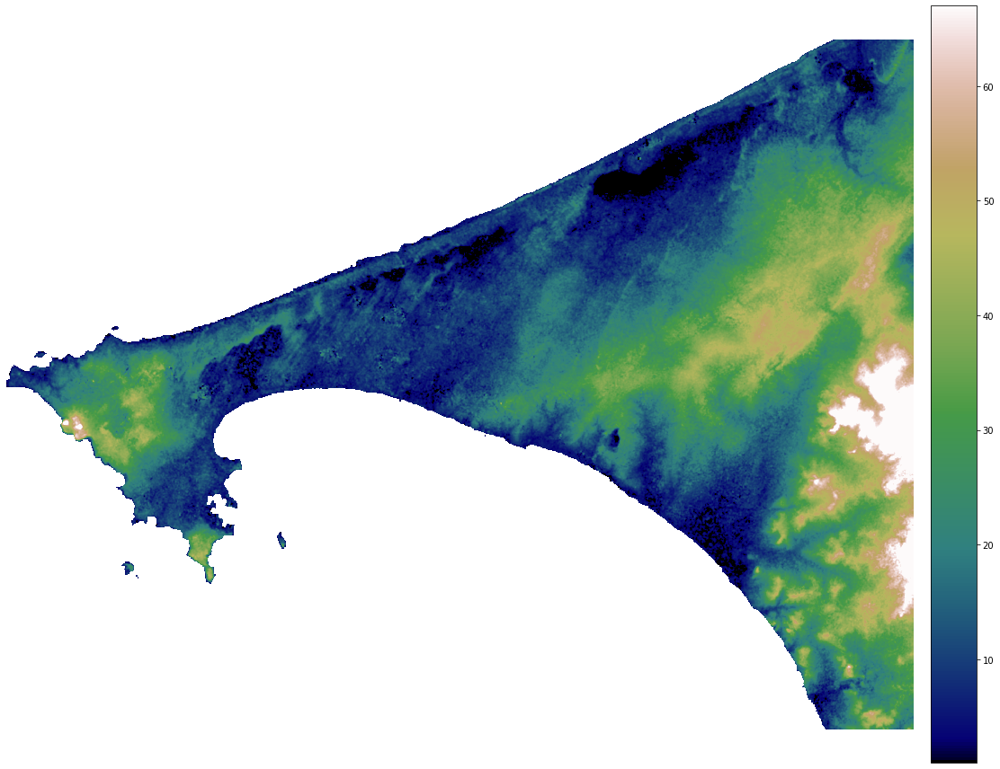

{'vmin': 1.0, 'vmax': 67.0}

In [59]:
rd.rdShow(dakar_srtm, axes=False, cmap='gist_earth', figsize=(16,12))

In [60]:
srtm_array = srtm_array.astype(float)
srtm_array

<xarray.DataArray (latitude: 1225, longitude: 1608)>
array([[ 0.,  0.,  0., ...,  9.,  9., 12.],
       [ 0.,  0.,  0., ...,  8.,  8., 10.],
       [ 0.,  0.,  0., ...,  9.,  9., 10.],
       ...,
       [ 0.,  0.,  0., ..., 31., 31., 29.],
       [ 0.,  0.,  0., ..., 32., 32., 29.],
       [ 0.,  0.,  0., ..., 32., 32., 29.]])
Coordinates:
    time         datetime64[ns] 2019-09-09
  * latitude     (latitude) float64 14.91 14.91 14.91 ... 14.58 14.58 14.58
  * longitude    (longitude) float64 -17.53 -17.53 -17.53 ... -17.1 -17.1 -17.1
    spatial_ref  int32 4326
    variable     <U9 'elevation'

In [61]:
srtm_flow = rd.FlowAccumulation(dakar_srtm, method="Dinf")

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


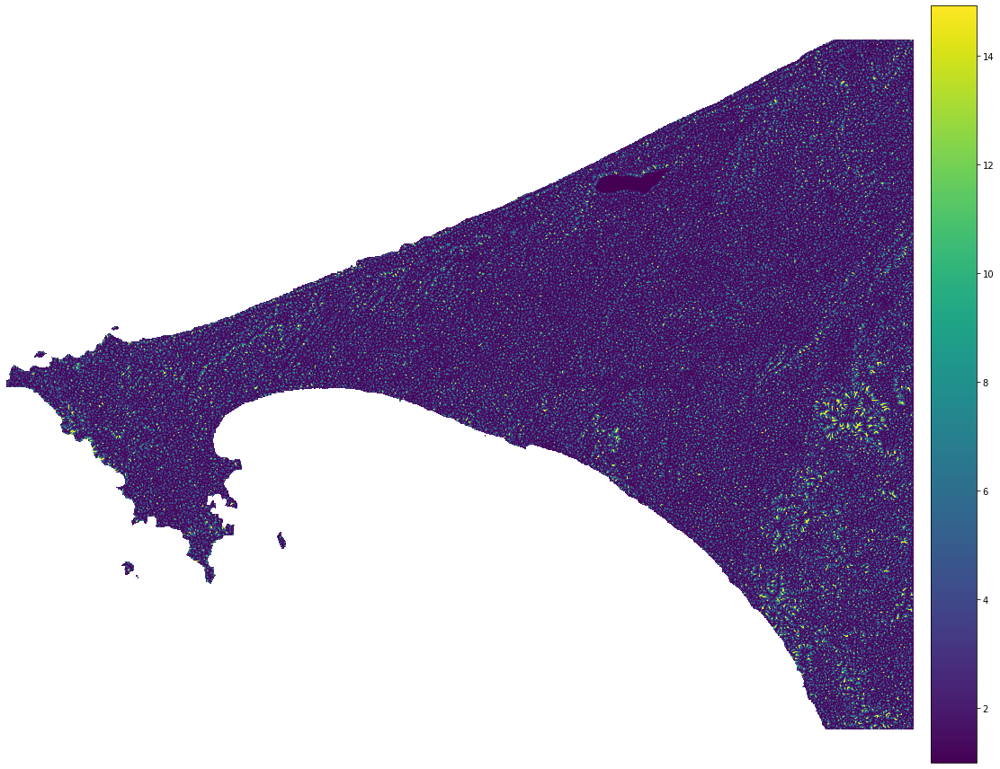

{'vmin': 1.0, 'vmax': 14.920520401004808}

In [62]:
rd.rdShow(srtm_flow, axes=False, cmap='viridis', figsize=(16,12))

In [63]:
srtm_filled = rd.FillDepressions(dakar_srtm, epsilon=True)

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


In [84]:
srtm_diff = srtm_filled - dakar_srtm
np.where(srtm_diff > 0, srtm_diff, np.nan)

array([[           nan,            nan,            nan, ...,
                   nan,            nan,            nan],
       [           nan,            nan,            nan, ...,
        1.77635684e-15, 3.55271368e-15,            nan],
       [           nan,            nan,            nan, ...,
                   nan,            nan,            nan],
       ...,
       [           nan,            nan,            nan, ...,
                   nan,            nan,            nan],
       [           nan,            nan,            nan, ...,
                   nan,            nan,            nan],
       [           nan,            nan,            nan, ...,
                   nan,            nan,            nan]])

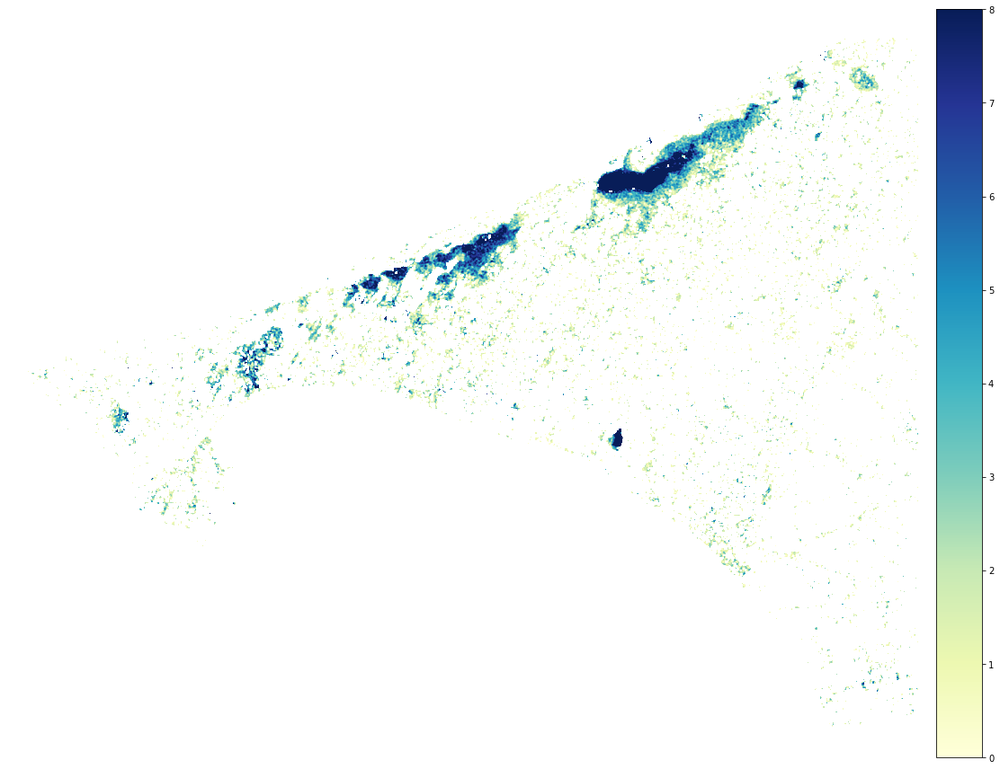

{'vmin': 1.7763568394002505e-15, 'vmax': 8.000000000000329}

In [96]:
rd.rdShow(rd.rdarray(np.where(srtm_diff > 0, srtm_diff, np.nan),no_data = np.nan), axes=False, cmap='YlGnBu', figsize=(16,12))

In [66]:
srtm_complete = rd.FillDepressions(dakar_srtm, epsilon=False)

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


In [67]:
srtm_eps = rd.FillDepressions(dakar_srtm, epsilon=True)

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


In [68]:
srtm_barnes = rd.ResolveFlats(srtm_complete)

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


In [101]:
srtm_fill_flow = rd.FlowAccumulation(srtm_eps, method="Dinf")
srtm_fill_flow

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


rdarray([[-1., -1., -1., ...,  1.,  1.,  1.],
         [-1., -1., -1., ...,  6.,  3.,  1.],
         [-1., -1., -1., ...,  2.,  2.,  1.],
         ...,
         [-1., -1., -1., ...,  6.,  1.,  1.],
         [-1., -1., -1., ...,  1.,  1.,  2.],
         [-1., -1., -1., ...,  1.,  1.,  1.]])

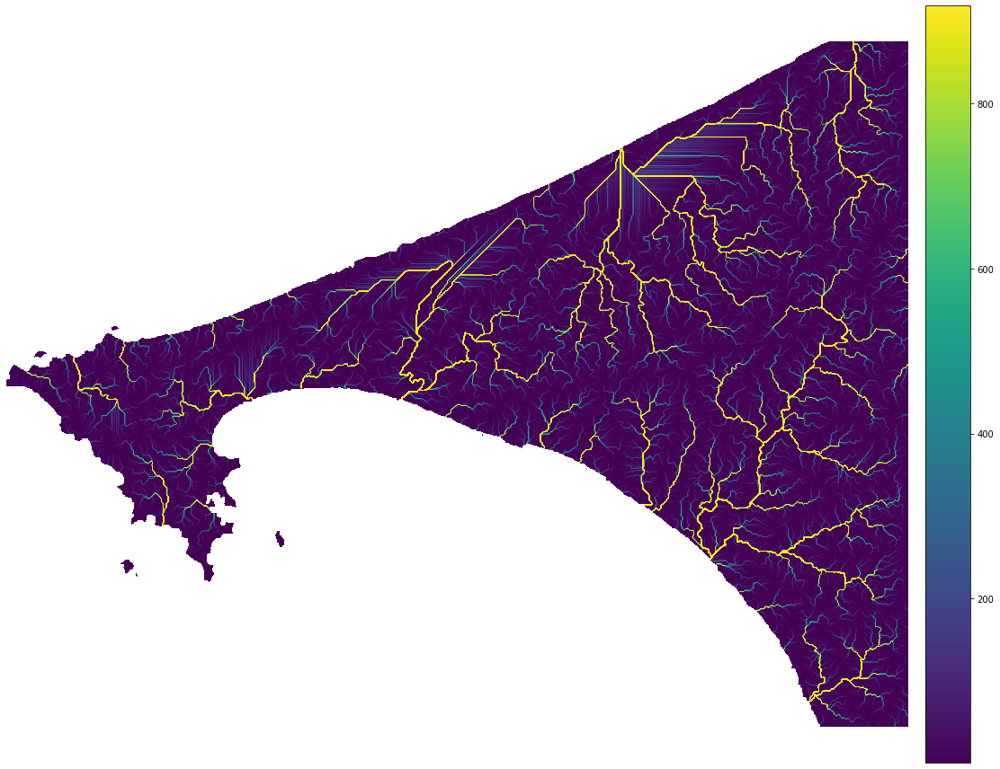

{'vmin': 1.0, 'vmax': 918.8689070319863}

In [98]:
rd.rdShow(srtm_fill_flow, axes=False, cmap='viridis', figsize=(16,12))

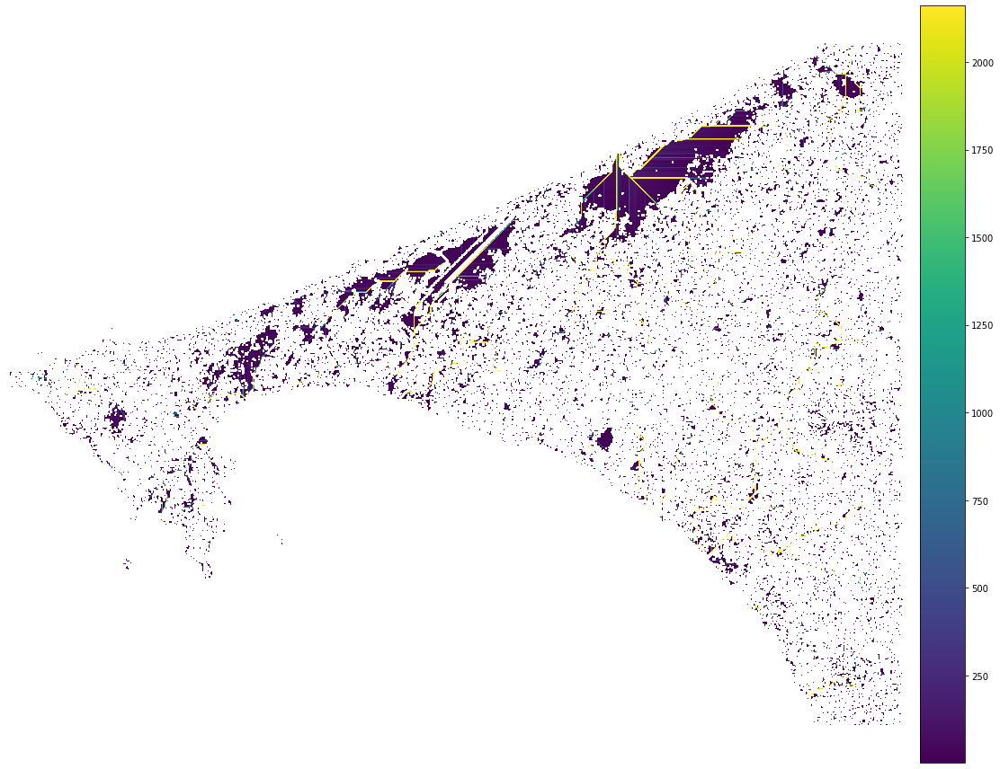

{'vmin': 1.5126275134874856, 'vmax': 2160.356585264562}

In [100]:
rd.rdShow(rd.rdarray(np.where(srtm_fill_flow > 1, srtm_fill_flow, np.nan),no_data = np.nan), axes=False, cmap='viridis', figsize=(16,12))

In [102]:
srtm_fill_flow_alt = rd.FlowAccumulation(srtm_barnes, method="Dinf")
srtm_fill_flow_alt

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


rdarray([[-1., -1., -1., ...,  1.,  1.,  1.],
         [-1., -1., -1., ...,  6.,  3.,  1.],
         [-1., -1., -1., ...,  2.,  2.,  1.],
         ...,
         [-1., -1., -1., ...,  3.,  1.,  1.],
         [-1., -1., -1., ...,  1.,  1.,  2.],
         [-1., -1., -1., ...,  1.,  1.,  1.]])

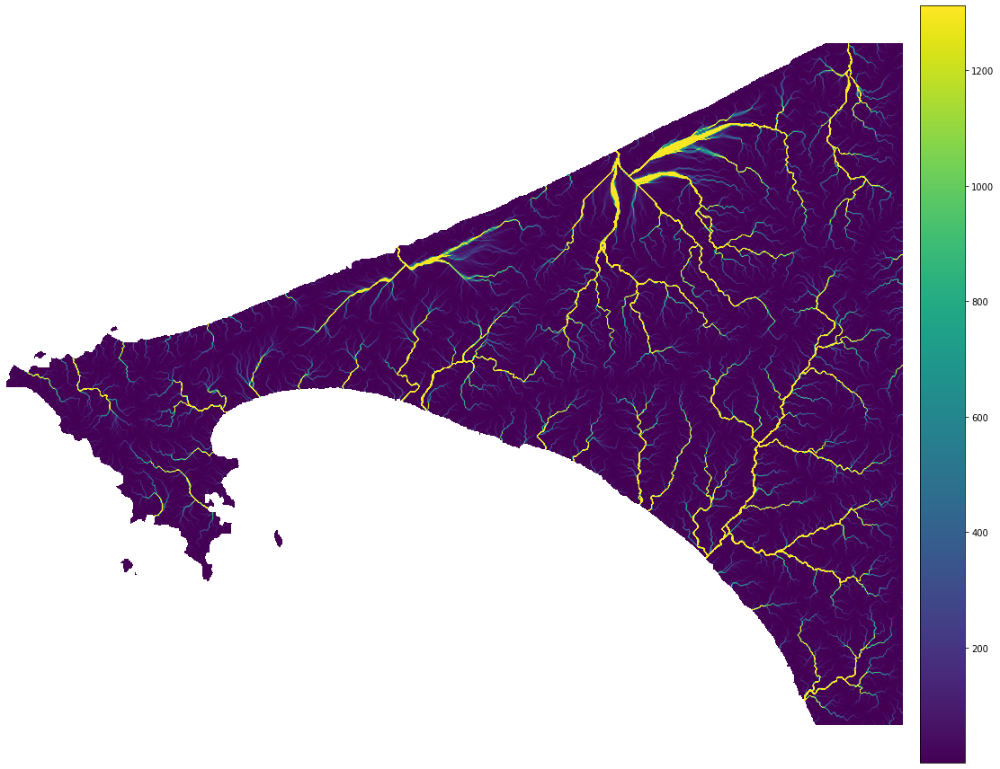

{'vmin': 1.0, 'vmax': 1312.0099822593495}

In [72]:
rd.rdShow(srtm_fill_flow_alt, axes=False, cmap='viridis', figsize=(16,12))

In [50]:
from skimage.morphology import flood_fill

In [51]:
srtm_array_mod = flood_fill(srtm_array.values, (0,0), -9999)

In [52]:
srtm_array_mod

array([[-9.999e+03, -9.999e+03, -9.999e+03, ...,  9.000e+00,  9.000e+00,
         1.200e+01],
       [-9.999e+03, -9.999e+03, -9.999e+03, ...,  8.000e+00,  8.000e+00,
         1.000e+01],
       [-9.999e+03, -9.999e+03, -9.999e+03, ...,  9.000e+00,  9.000e+00,
         1.000e+01],
       ...,
       [ 0.000e+00,  0.000e+00,  0.000e+00, ...,  3.100e+01,  3.100e+01,
         2.900e+01],
       [ 0.000e+00,  0.000e+00,  0.000e+00, ...,  3.200e+01,  3.200e+01,
         2.900e+01],
       [ 0.000e+00,  0.000e+00,  0.000e+00, ...,  3.200e+01,  3.200e+01,
         2.900e+01]])

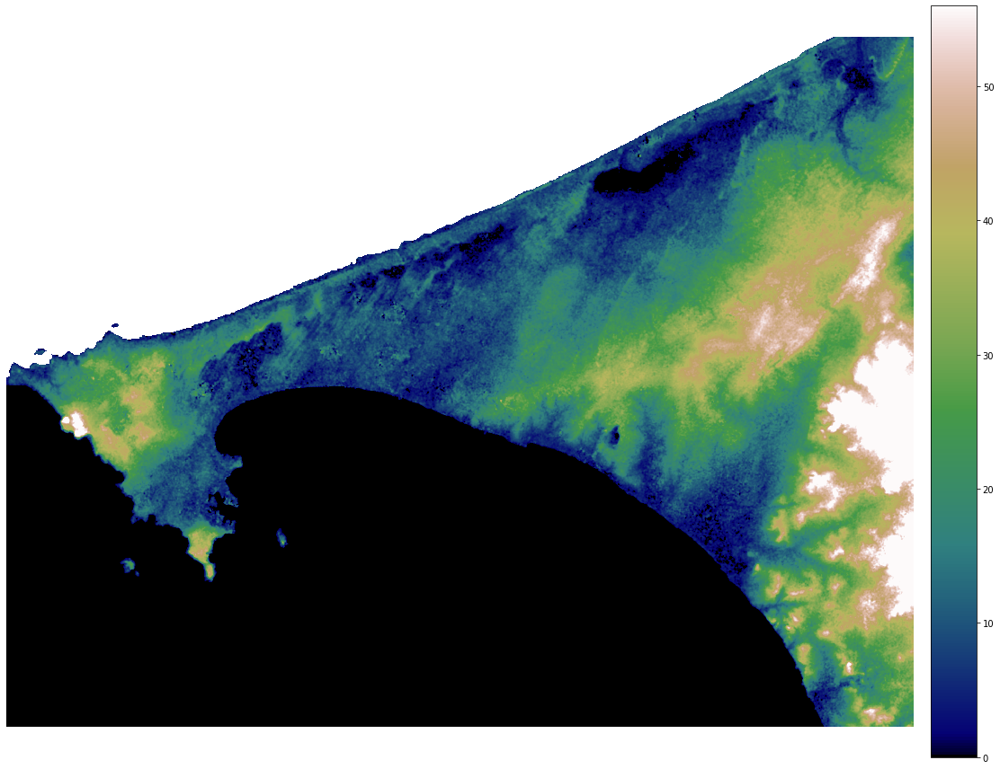

{'vmin': 0.0, 'vmax': 56.0}

In [53]:
rd.rdShow(rd.rdarray(srtm_array_mod, no_data= -9999), axes=False, cmap='gist_earth', figsize=(16,12))

In [94]:
srtm_array_mod = flood_fill(flood_fill(srtm_array.values, (1224,0), -9999), (0,0), -9999)

In [ ]:
dakar_props = rd.FlowProportions(dakar_srtm, method="Dinf")

In [ ]:
dakar_props